# Urban Testbed Project

In [1]:
# importing required libraries
import networkx as nx
import osmnx as ox
import pandas as pd
import numpy as np
import folium
import geopy.distance
from IPython.display import IFrame
ox.config(log_console=True, use_cache=True)

**Create Graph of Champaign**

In [2]:
place = 'Champaign, Illinois, USA'
gdf = ox.gdf_from_place(place)
area = ox.projection.project_gdf(gdf).unary_union.area
G = ox.graph_from_place(place, network_type='drive_service',simplify = True)
components = list(nx.strongly_connected_components(G))
for item in components:
    if len(item) == 0 or  len(item) == 1:
        G.remove_node(item.pop())
hwy_speeds = {'residential': 35,
              'secondary': 50,
              'tertiary': 60}
G = ox.add_edge_speeds(G, hwy_speeds)
G = ox.add_edge_travel_times(G)

**Visualize Champaign Graph**

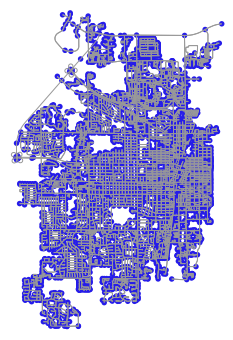

In [3]:
# Plot all nodes and edges
fig, ax = ox.plot_graph(G, node_size=30, node_color='#261CE9')   

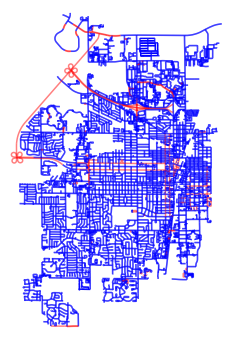

In [4]:
# Plot oneway streets
ec = ['r' if data['oneway'] else 'b' for u, v, key, data in G.edges(keys=True, data=True)]
fig, ax = ox.plot_graph(G, node_size=0, edge_color=ec, edge_linewidth=1.5, edge_alpha=0.5)

## Tracts Population Data

In this section, we import population data and location of centers of nearby tracts and use the data to assign population score to each node.

**Import and Visualize Population Data of Nearby Tracts**

Import data of the population and coordinates of the centers of nearby tracts.

In [5]:
file_name = 'Population.xlsx'
df = pd.read_excel(file_name)

## Convert dataframe into points for plotting
datapoints_list = list(df.to_records(index=False))

## Create folium map and add points

# Define and create map with appropriate boundaries
global_lat = []; global_lon = []; max_pop = 0
for point in datapoints_list:
    global_lat.append(point[2]) #lat
    global_lon.append(point[3]) #lon
    if point[1] > max_pop:
        max_pop = point[1]
min_point = [min(global_lat), min(global_lon)]
max_point =[max(global_lat), max(global_lon)]
m = folium.Map(zoom_start=1, tiles='cartodbdark_matter')
m.fit_bounds([min_point, max_point])

# Add source population data and corresponding points to the graph
for point in datapoints_list:
    folium.Circle(
          location=[point[2], point[3]],
          popup= "Population:"+str(point[1]),
          radius= 1000*point[1]/max_pop,
          color='blue',
          fill=True,
          fill_color='blue'
    ).add_to(m)


# Add nodes (intersections) from our graph to the map
nodes_data = list(G.nodes(data=True))

for node in nodes_data:
    folium.CircleMarker(location=[node[1]['y'], node[1]['x']],
    radius= 0.5,
    color='red',
    fill=True).add_to(m)    
m

**Assign Population Scores to Node Based on Tract Data**

We assign what we call population score to every node in the graph. The population score is a measure of population density in the vicinity of the node. The score is generated by considering by taking the sum of (population of tract)/(distance to tract center) for each of the nearby tracts.

In [6]:
Population_Score = {}   

#create a new dict for population score
node_ID = list(G.nodes())
for i in node_ID:
    x1 = G.nodes[i]['x']
    y1 = G.nodes[i]['y']
    p1 = [y1,x1]
    pop_score = 0
    for j in range(43):
        x2 = df.at[j,'Long']
        y2 = df.at[j,'Lat']
        p2 = [y2,x2]
        pop = df.at[j,'Population']
        dis = geopy.distance.great_circle(p1, p2).km*1000+1
        pop_score = pop_score+pop/dis # sum of score components from each tract
    
    Population_Score.update({i:pop_score})
    
# Normalize population scores
Pop_max = max(Population_Score.values())
for i in node_ID:
    pop = Population_Score.pop(i)
    pop = pop/Pop_max
    Population_Score.update({i:pop})
    
# Add population scores as attribute 'pop_score' to the nodes in the graph
for key, value in Population_Score.items():
    G.nodes[key]['pop_score'] = value
    
# Verify if the attribute is indeed added to the node
nodes_data = list(G.nodes(data=True))
print(nodes_data[0])

(5912707072, {'y': 40.0852037, 'x': -88.2362914, 'osmid': 5912707072, 'pop_score': 0.11778536234172621})


## Blocks Population Data

In this section, we import population data and location of centers of all blocks in Champaign county and process the data to extract blocks of interest. We then proceed to generate population scores to all the nodes in the graph depending on the population of the K-nearest blocks. The data is obtained from the following source: ftp://ftp2.census.gov/geo/tiger/TIGER2010BLKPOPHU. The following is a visualization of all blocks and block centers in Champaign county.

![block center visualization](champaigncounty_blockcenters.PNG)

**Import and Process Raw Data**

In [7]:
# Import raw data
raw_blockdata = pd.read_csv('champaigncounty_blockdata.csv')


# Select and isolate data from tracts of interest
tracts_ofinterest = [1205, 902, 1204, 1206, 1201, 1203, 1000, 901, 1100, 1301, 1302, 500, 11000, 700, 800, 5300, 200, 302, 301, 402, 401, 1400, 11100, 5900, 5800, 6000, 5401, 5402, 5500, 5600, 5701, 5702]

# Isolate data from tracts of interest
data_temp = raw_blockdata.loc[raw_blockdata['TRACTCE10'].isin(tracts_ofinterest)]
data_areaofint = data_temp.filter(['POP10','Latitude','Longitude'], axis=1)
data_areaofint.columns = ['population', 'latitude', 'longitude']
data_areaofint = data_areaofint.reset_index(drop=True)

# Export processed data into a csv file
data_areaofint.to_csv('cus_blockdata.csv')

**Import and Visualize Champaign-Urbana-Savoy Data**

In [8]:
# Import data from  csv file
cus_blockdata = pd.read_csv('cus_blockdata.csv', index_col=0)


## Convert dataframe into points for plotting
datapoints_list = list(cus_blockdata.to_records(index=False))

## Create folium map and add points

# Define and create map with appropriate boundaries
global_lat = []; global_lon = []; max_pop = 0
for point in datapoints_list:
    global_lat.append(point[1]) #lat
    global_lon.append(point[2]) #lon
    if point[0] > max_pop:
        max_pop = point[0]
min_point = [min(global_lat), min(global_lon)]
max_point =[max(global_lat), max(global_lon)]
map_blocks = folium.Map(zoom_start=1, tiles='cartodbdark_matter')
map_blocks.fit_bounds([min_point, max_point])

# Add block centers and population to the graph
for point in datapoints_list:
    folium.Circle(
          location=[point[1], point[2]],
          popup= "Population:"+str(point[0]),
          radius= 2*point[0]/max_pop,
          color='blue',
          fill=True,
          fill_color='blue'
    ).add_to(map_blocks)


# Add nodes (intersections) from our graph to the map
nodes_data = list(G.nodes(data=True))

for node in nodes_data:
    folium.CircleMarker(location=[node[1]['y'], node[1]['x']],
    radius= 0.5,
    color='red',
    fill=True).add_to(map_blocks)    
map_blocks

**Assign Population Scores to Nodes Based on Blocks Data**

In [9]:
# Function for K-nearest neighbor population estimate
def find_knn(k,G,node_id,pop_data):
    x1 = G.nodes[node_id]['x']
    y1 = G.nodes[node_id]['y']
    p1 = [y1,x1]
    distances = []
    for point in pop_data:
        x2 = point[2]
        y2 = point[1]
        p2 = [y2,x2]
        distances.append(geopy.distance.great_circle(p1, p2).km)
    index = list(np.argsort(distances)[:k])
    k_nearestnodes = [pop_data[i] for i in index]
    return k_nearestnodes
    
def find_popscore(k,graph,node_id,pop_data):
    pop_score = 0
    k_nearestnodes = find_knn(k,graph,node_id,pop_data)
    for node in k_nearestnodes:
        pop_score += node[0]
    return pop_score/k

In [10]:
# Use the k-nearest neighbors to assign pop_score to all nodes in the graph

# Import block data
cus_blockdata = pd.read_csv('cus_blockdata.csv', index_col=0)
pop_data = list(cus_blockdata.to_records(index=False))

k = 5 # no.of neighbors to consider
for node_id in list(G.nodes()):
    G.nodes[node_id]['pop_score_block'] = find_popscore(k,G,node_id,pop_data)
    
# Verify if the attribute is indeed added to the node
nodes_data = list(G.nodes(data=True))
print(nodes_data[0])

(5912707072, {'y': 40.0852037, 'x': -88.2362914, 'osmid': 5912707072, 'pop_score': 0.11778536234172621, 'pop_score_block': 0.0})


## Population Score Heatmap - Tract vs Block Data

Comparing the population scores obtained based on tract data and block data.

For some reason if you uncomment this section it would report error

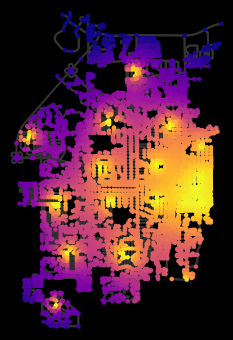

ValueError: Bin edges must be unique: array([  0.        ,   0.        ,   0.        , ..., 769.40665434,
       792.8       , 792.8       ]).
You can drop duplicate edges by setting the 'duplicates' kwarg

In [11]:
nc1 = ox.plot.get_node_colors_by_attr(G, 'pop_score', cmap='plasma')
fig1, ax1 = ox.plot_graph(G, node_color=nc1, node_size=20, node_zorder=2,
                        edge_linewidth=2, edge_color='#333333', bgcolor='k')
#nc2 = ox.plot.get_node_colors_by_attr(G, 'pop_score_block', cmap='plasma')
#fig2, ax2 = ox.plot_graph(G, node_color=nc2, node_size=20, node_zorder=2,
  #                      edge_linewidth=2, edge_color='#333333', bgcolor='k')

In [21]:
nx.is_strongly_connected(G) 

True

In [15]:
# create a dictionary for all possible routs
path_lengths = dict(nx.all_pairs_dijkstra_path_length(G, weight='travel_time')) 
# initialize by placing all facilities in the node with highest centriality
extended_stats = ox.extended_stats(G, ecc=False, bc=True, cc=False)
startN,dump = max(extended_stats['betweenness_centrality'].items(), key=lambda x: x[1])
# start with all facility at startN
# initialize a few parameters before running
facility = [startN * item for item in [1,1,1,1,1]]
score_old = 0
for i in node_ID:
    score_old = score_old + path_lengths[facility[0]][i]*G.nodes[i]['pop_score']
score_old

216389.93274687475

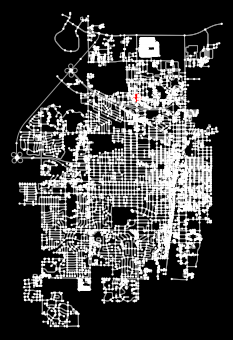

In [17]:
# visualize initial input
nc = ['r' if node in facility else 'w' for node in G.nodes()]
ns = [80 if node in facility else 5 for node in G.nodes()]
fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k')

In [22]:
# loop through each facility, until there is no better score 
score_new = score_old
while score_new <= score_old:
    score_old = score_new
    for i in range(5):
        neigh = list(G.neighbors(facility[i]))
        temp = facility
        TEMP_SCORE = []
        for item in neigh:

            temp_score = 0
            temp[i] = item
            for j in node_ID:
                path = min([path_lengths[t][j] for t in temp])
                temp_score = temp_score+path*G.nodes[j]['pop_score']
            TEMP_SCORE.append(temp_score)
        score_new = min(TEMP_SCORE)
        step_dir = neigh[TEMP_SCORE.index(score_new)]
        facility[i] = step_dir
score_new

82369.94279672802

In [23]:
# Actual location of facilities
facility


[38108759, 6131184899, 38058590, 38078381, 38146585]

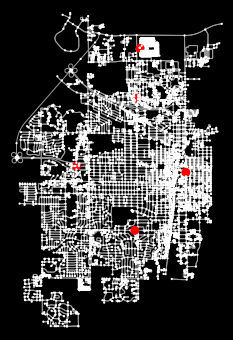

In [24]:
# Visualization of the result
nc = ['r' if node in facility else 'w' for node in G.nodes()]
ns = [80 if node in facility else 5 for node in G.nodes()]
fig, ax = ox.plot_graph(G, node_size=ns, node_color=nc, node_zorder=2, bgcolor='k')

## Snippets - Distance and Adjacent Nodes

In [ ]:
## -------------------- Quick Hack to Make the Graph Connected --------- ##

# Check connectedness
nx.is_strongly_connected(G) # Currently is false

# Find connected components
components = list(nx.strongly_connected_components(G))
len(components) # There are 69 strongly connected components. Looking at the list shows we have 
# 68 disconnected single components and one large 7000+ nodes strongly connected component.
# We remove those 68 single components

# remove disconnected nodes
for item in components:
    if len(item) == 1:
        G.remove_node(item.pop())

# Test connectedness again
nx.is_strongly_connected(G) # True; now the graph is strongly connected



## ----------- Easy Way to Find Shortest Distances Between All Nodes ----------- ##

path_lengths = dict(nx.all_pairs_dijkstra_path_length(G, weight='length')) # change to required attribute
# to use the distance from node 'n1' to node 'n2' use path_lengths[n1][n2]



## --------------- Finding Adjacent Nodes ------------------ ##

# to return a list of neighboring node IDs use list(G.neighbors(nodeid))
list(G.neighbors(5912707072)) # test